# Tarea 1 : Algoritmos Paralelos en Computación Científica

### Nombre: Tatiana Flores

--------------------------------------------------------------------------------------------------------

#### ![alt text](image.png)

##### a)

In [1]:
import numpy as np
from matplotlib import pyplot as plt

In [2]:
n_points = 10000
print("Number of data points:", n_points)

Number of data points: 10000


In [3]:
# set the seed for reproducibility
np.random.seed(0)

In [4]:
from sklearn.datasets import make_blobs
n_clusters = 3
dataset, _ = make_blobs(n_samples=n_points, n_features=2, centers=n_clusters)
print("Created a dataset that represents", n_clusters, "clusters in", dataset.shape[1], "dimensions.")

Created a dataset that represents 3 clusters in 2 dimensions.


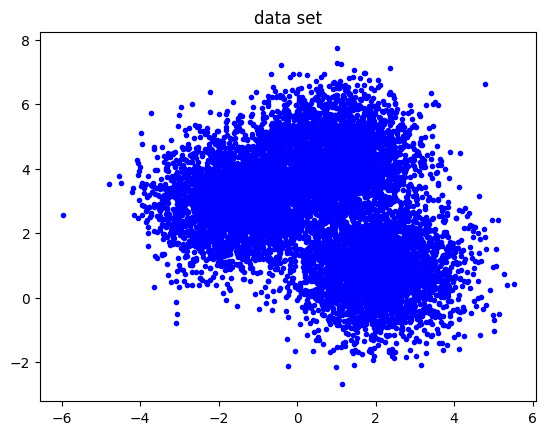

In [5]:
plt.plot(dataset[:,0], dataset[:,1], 'b.')
plt.title('data set')
plt.show()

The *k*-means algorithm is an iterative method that searches for *k* clusters. Each cluster is represented by a center, and all points are assigned to the closest center in space.

As for all iterative methods, an initial guess must be provided. Here, the starting centers are uniformly distributed on the line $0<x<1$ and $y=0$.

In [6]:
k = 7
print("Number of clusters:", k)

Number of clusters: 7


In [7]:
centers = np.zeros([k, 2])
for c in range(k):
    centers[c,0] = float(c+1)/(k+1)
    centers[c,1] = 0.0

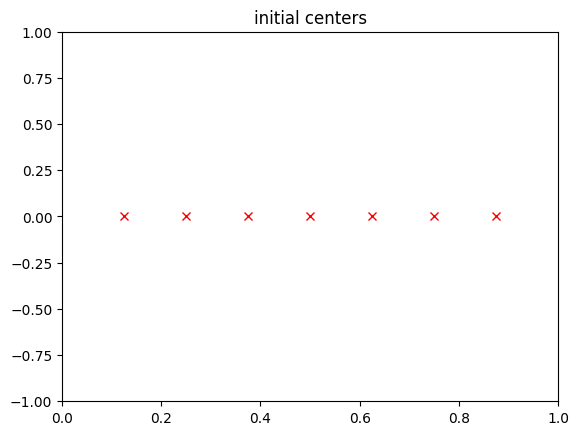

In [8]:
plt.plot(centers[:,0], centers[:,1], 'rx')
plt.xlim([0,1])
plt.ylim([-1,1])
plt.title('initial centers')
plt.show()

The *k*-means algorithm iteratively improves the center locations, mainly through two steps.

 1. The assignment step loops over all data points and searches for the closest center. Each data point is labelled with the closest center, that is, its cluster.

 1. The update step calculates the center of mass of each cluster. This will be the new center of this cluster.

These two steps are repeated until the clusters do not change anymore, or when the maximum number of iteration specified is reached.

In [9]:
max_iterations = 1000

In [10]:
%%time

# store the history of centers and clusters
history_of_centers = [centers]
history_of_clusters = []

for iteration in range(max_iterations):

    old_centers = history_of_centers[-1]

    # assignment step
    cluster = np.zeros(n_points, dtype='int')
    for p in range(n_points):
        minimum_distance = np.inf
        nearest_cluster = None
        for c in range(k):
            distance_to_cluster_c = np.sqrt((dataset[p,0] - old_centers[c,0])**2 + (dataset[p,1] - old_centers[c,1])**2)
            if distance_to_cluster_c < minimum_distance:
                minimum_distance = distance_to_cluster_c
                nearest_cluster = c
        cluster[p] = nearest_cluster
    history_of_clusters.append(cluster)

    # check convergence
    if iteration > 0:
        clusters_changed = False
        for p in range(n_points):
            if history_of_clusters[-1][p] != history_of_clusters[-2][p]:
                clusters_changed = True
        if not clusters_changed:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    number_of_points_in_cluster = np.zeros(k, dtype='int')
    sum_of_locations = np.zeros([k, 2], dtype='float')
    for p in range(n_points):
        number_of_points_in_cluster[cluster[p]] += 1
        sum_of_locations[cluster[p], :] += dataset[p, :]
    new_centers = np.zeros([k, 2], dtype='float')
    for c in range(k):
        new_centers[c,0] = sum_of_locations[c,0] / number_of_points_in_cluster[c]
        new_centers[c,1] = sum_of_locations[c,1] / number_of_points_in_cluster[c]
    history_of_centers.append(new_centers)

if iteration == max_iterations-1:
    print("The algorithm did not converge in", max_iterations, "iterations.")

Converged in 104 iterations.

CPU times: total: 19.2 s
Wall time: 19.9 s


Let us visualize the clusters.

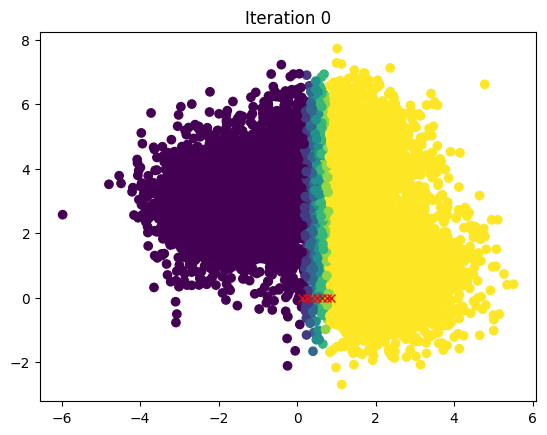

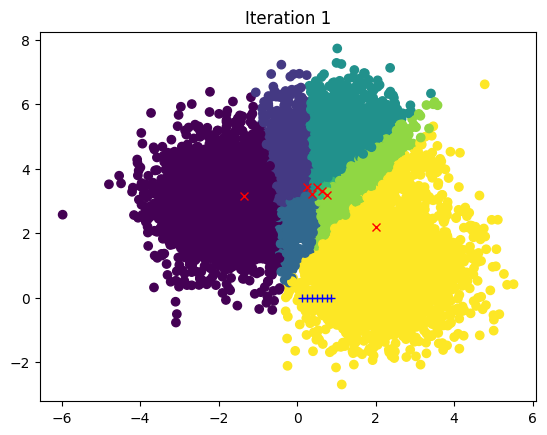

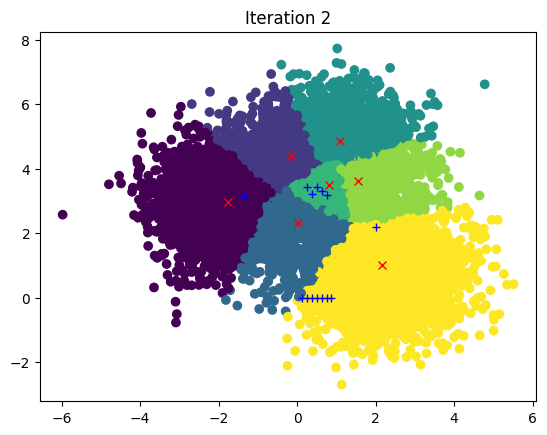

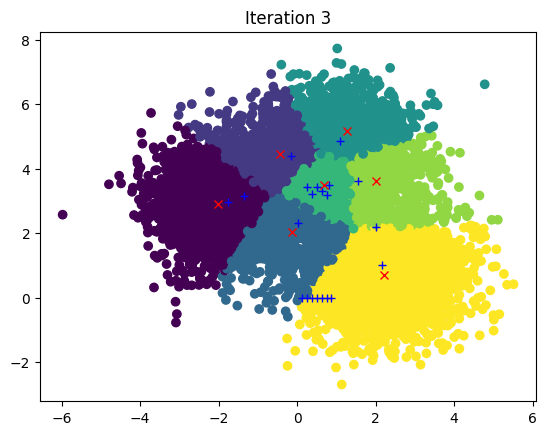

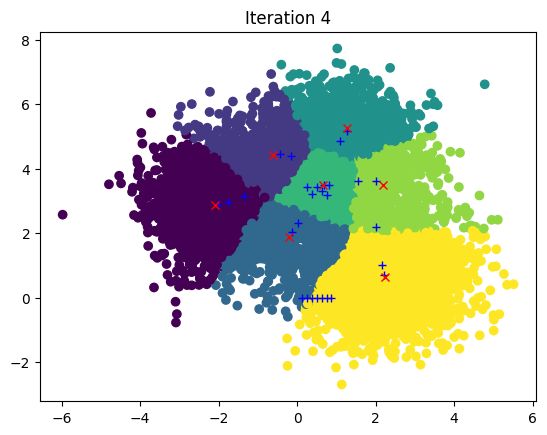

...

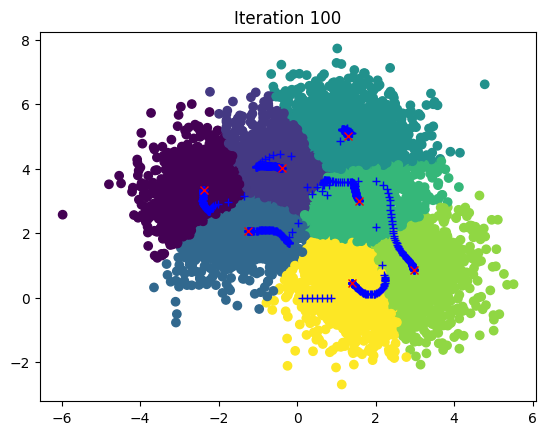

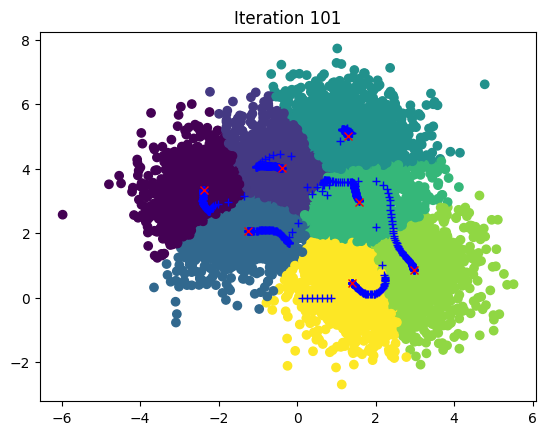

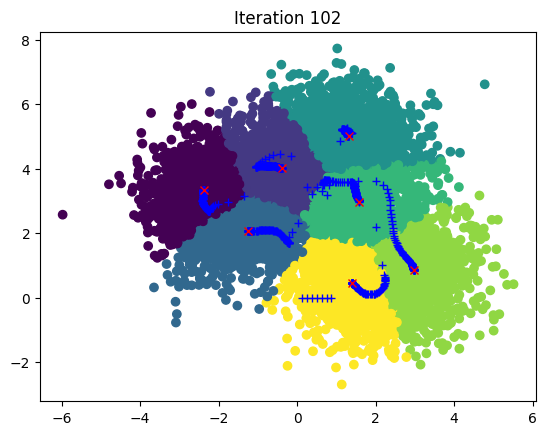

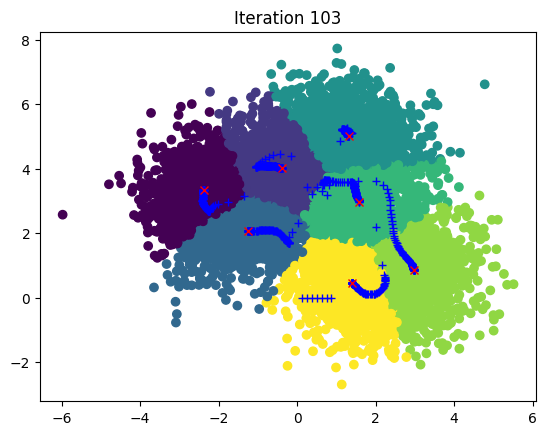

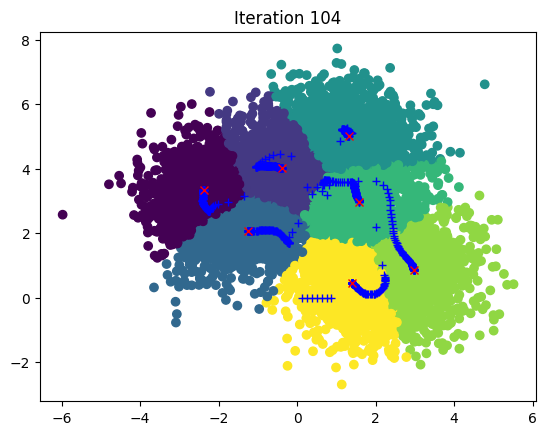

In [11]:
for itr in range(iteration+1):
    plt.scatter(dataset[:,0], dataset[:,1], c=history_of_clusters[itr])
    for l in range(itr):
        plt.plot(history_of_centers[l][:,0], history_of_centers[l][:,1], 'b+')
    plt.plot(history_of_centers[itr][:,0], history_of_centers[itr][:,1], 'rx')
    plt.title("Iteration "+str(itr))
    plt.show()

The algorithm indeed finds clusters of data points.

In [12]:
def calc_dispersion(datapoints, cluster, centers):
    dispersion = 0.0
    for i in range(centers.shape[0]):
        dispersion += np.sum( np.linalg.norm( datapoints[cluster==i, :] - centers[i,:], axis=1 ) )
    return dispersion

In [13]:
dispersion = calc_dispersion(dataset, history_of_clusters[-1], history_of_centers[-1])
print("The dispersion of the clustering is", dispersion)

The dispersion of the clustering is 8721.596962236536


##### b)

Se mantienen la cantidad de registros pero el valor de k lo cambiamos a 5.

In [14]:
n_points_b = 10000
print("Number of data points:", n_points_b)

Number of data points: 10000


In [15]:
n_clusters_b = 3
dataset_b, _ = make_blobs(n_samples=n_points_b, n_features=2, centers=n_clusters_b)
print("Created a dataset that represents", n_clusters_b, "clusters in", dataset_b.shape[1], "dimensions.")

Created a dataset that represents 3 clusters in 2 dimensions.


In [16]:
k_b = 5
print("Number of clusters:", k_b)

Number of clusters: 5


In [17]:
centers_b = np.zeros([k_b, 2])
for c in range(k_b):
    centers_b[c,0] = float(c+1)/(k_b+1)
    centers_b[c,1] = 0.0

In [18]:
%%time

# store the history of centers and clusters
history_of_centers_b = [centers_b]
history_of_clusters_b = []

for iteration in range(max_iterations):

    old_centers = history_of_centers_b[-1]

    # assignment step
    cluster = np.zeros(n_points_b, dtype='int')
    for p in range(n_points_b):
        minimum_distance = np.inf
        nearest_cluster = None
        for c in range(k_b):
            distance_to_cluster_c = np.sqrt((dataset_b[p,0] - old_centers[c,0])**2 + (dataset_b[p,1] - old_centers[c,1])**2)
            if distance_to_cluster_c < minimum_distance:
                minimum_distance = distance_to_cluster_c
                nearest_cluster = c
        cluster[p] = nearest_cluster
    history_of_clusters_b.append(cluster)

    # check convergence
    if iteration > 0:
        clusters_changed = False
        for p in range(n_points_b):
            if history_of_clusters_b[-1][p] != history_of_clusters_b[-2][p]:
                clusters_changed = True
        if not clusters_changed:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    number_of_points_in_cluster = np.zeros(k_b, dtype='int')
    sum_of_locations = np.zeros([k_b, 2], dtype='float')
    for p in range(n_points_b):
        number_of_points_in_cluster[cluster[p]] += 1
        sum_of_locations[cluster[p], :] += dataset_b[p, :]
    new_centers = np.zeros([k_b, 2], dtype='float')
    for c in range(k_b):
        new_centers[c,0] = sum_of_locations[c,0] / number_of_points_in_cluster[c]
        new_centers[c,1] = sum_of_locations[c,1] / number_of_points_in_cluster[c]
    history_of_centers_b.append(new_centers)

if iteration == max_iterations-1:
    print("The algorithm did not converge in", max_iterations, "iterations.")

Converged in 16 iterations.

CPU times: total: 2.47 s
Wall time: 2.6 s


In [19]:
dispersion_b = calc_dispersion(dataset_b, history_of_clusters_b[-1], history_of_centers_b[-1])
print("The dispersion of the clustering is", dispersion_b)

The dispersion of the clustering is 11174.291132956925


La dispersión aumenta al reducir k.

#### 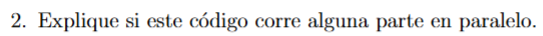

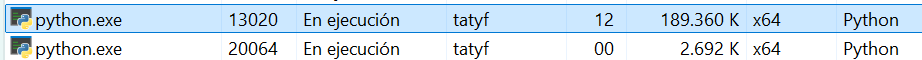

Por los librerías/módulos importados, existe la posibilidad de que el código corra partes en paralelo, dado que son librerías que usan código compilado (como NumPy usa LAPACK y BLAS).

Sin embargo, en este código esto no se nota en ningún momento en el Administrador de Tareas, y siempre se mantiene cómo en la imagen adjunta. Cambiando levemente los valores, pero sólo mostrando dos pestañas de Python.

Esto porque la mayor parte de las operaciones que podrían aprovechar el paralelismo, se hace mediante ciclos.

#### 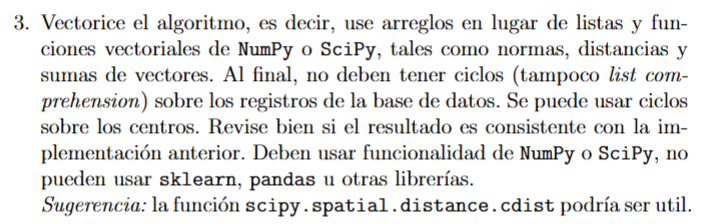

In [20]:
import numpy as np
import scipy as sp

Se trata de comparar entorno al código compartido en la tarea, al igual que el k= 7 y el número de registros de dicho código.

Se utilizó ChatGPT para internalizar los módulos de Numpy y Scipy, en especial para poder conocer varias funciones y su correcto uso.

In [21]:
centers_2 = np.zeros((k, 2), dtype=float)
centers_2[:, 0] = np.arange(1, k+1)/(k+1)

# Verificamos que este código no genera modificaciones en torno al original.
# Es decir, se mantiene igual que el original.
print(centers==centers_2)

[[ True  True]
 [ True  True]
 [ True  True]
 [ True  True]
 [ True  True]
 [ True  True]
 [ True  True]]


In [22]:
%%time

# store the history of centers and clusters
history_of_centers_2 = [centers_2]
history_of_clusters_2 = []

for iteration in range(max_iterations):

    old_centers_2 = history_of_centers_2[-1]

    # assignment step
    distancias = sp.spatial.distance.cdist(dataset, old_centers_2, metric='euclidean', out=None)
    cluster_2 = np.argmin(distancias, axis=1)

    history_of_clusters_2.append(cluster_2)

    # check convergence
    if iteration > 0:
        clusters_changed_2 = np.any(history_of_clusters_2[-1] != history_of_clusters_2[-2])
        if not clusters_changed_2:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    sum_of_locations_2 = np.zeros((k, dataset.shape[1]), dtype='float')

    ## para contar cuántos puntos hay
    number_of_points_in_cluster_2 = np.bincount(cluster_2, minlength=k)
    ## para la suma de locaciones por cluster, se acumula por índice de cluster
    np.add.at(sum_of_locations_2, cluster_2, dataset)

    new_centers_2 = np.array(old_centers_2, copy=True)

    indice = number_of_points_in_cluster_2 > 0
    new_centers_2[indice] = sum_of_locations_2[indice]/number_of_points_in_cluster_2[indice, None]

    history_of_centers_2.append(new_centers_2)

if iteration == max_iterations-1:
    print("The algorithm did not converge in", max_iterations, "iterations.")

Converged in 104 iterations.

CPU times: total: 156 ms
Wall time: 139 ms


#### 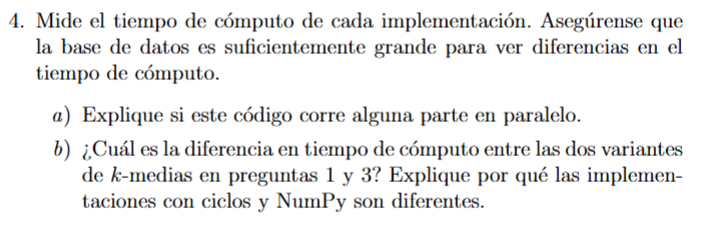

##### Medimos el tiempo de cómputo de cada implementación, considerando los centers que no fueron considerados en las partes anteriores

In [23]:
%%time

centers = np.zeros([k, 2])
for c in range(k):
    centers[c,0] = float(c+1)/(k+1)
    centers[c,1] = 0.0

# store the history of centers and clusters
history_of_centers = [centers]
history_of_clusters = []

for iteration in range(max_iterations):

    old_centers = history_of_centers[-1]

    # assignment step
    cluster = np.zeros(n_points, dtype='int')
    for p in range(n_points):
        minimum_distance = np.inf
        nearest_cluster = None
        for c in range(k):
            distance_to_cluster_c = np.sqrt((dataset[p,0] - old_centers[c,0])**2 + (dataset[p,1] - old_centers[c,1])**2)
            if distance_to_cluster_c < minimum_distance:
                minimum_distance = distance_to_cluster_c
                nearest_cluster = c
        cluster[p] = nearest_cluster
    history_of_clusters.append(cluster)

    # check convergence
    if iteration > 0:
        clusters_changed = False
        for p in range(n_points):
            if history_of_clusters[-1][p] != history_of_clusters[-2][p]:
                clusters_changed = True
        if not clusters_changed:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    number_of_points_in_cluster = np.zeros(k, dtype='int')
    sum_of_locations = np.zeros([k, 2], dtype='float')
    for p in range(n_points):
        number_of_points_in_cluster[cluster[p]] += 1
        sum_of_locations[cluster[p], :] += dataset[p, :]
    new_centers = np.zeros([k, 2], dtype='float')
    for c in range(k):
        new_centers[c,0] = sum_of_locations[c,0] / number_of_points_in_cluster[c]
        new_centers[c,1] = sum_of_locations[c,1] / number_of_points_in_cluster[c]
    history_of_centers.append(new_centers)

if iteration == max_iterations-1:
    print("The algorithm did not converge in", max_iterations, "iterations.")

Converged in 104 iterations.

CPU times: total: 18.8 s
Wall time: 19.9 s


In [24]:
%%time

centers_2 = np.zeros((k, 2), dtype=float)
centers_2[:, 0] = np.arange(1, k+1)/(k+1)

# store the history of centers and clusters
history_of_centers_2 = [centers_2]
history_of_clusters_2 = []

for iteration in range(max_iterations):

    old_centers_2 = history_of_centers_2[-1]

    # assignment step
    distancias = sp.spatial.distance.cdist(dataset, old_centers_2, metric='euclidean', out=None)
    cluster_2 = np.argmin(distancias, axis=1)

    history_of_clusters_2.append(cluster_2)

    # check convergence
    if iteration > 0:
        clusters_changed_2 = np.any(history_of_clusters_2[-1] != history_of_clusters_2[-2])
        if not clusters_changed_2:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    sum_of_locations_2 = np.zeros((k, dataset.shape[1]), dtype='float')
    number_of_points_in_cluster_2 = np.bincount(cluster_2, minlength=k)
    np.add.at(sum_of_locations_2, cluster_2, dataset)

    new_centers_2 = np.array(old_centers_2, copy=True)

    indice = number_of_points_in_cluster_2 > 0
    new_centers_2[indice] = sum_of_locations_2[indice]/number_of_points_in_cluster_2[indice, None]

    history_of_centers_2.append(new_centers_2)

if iteration == max_iterations-1:
    print("The algorithm did not converge in", max_iterations, "iterations.")

Converged in 104 iterations.

CPU times: total: 109 ms
Wall time: 118 ms


##### a)

Este código podría correr partes en paralelo, esto producto de las librerías utilizadas que, como bien vimos en clase, aunque python prohibe el paralelismo entre diferentes líneas de código, es una opción usar librerías de código compilado, tal como NumPy en este caso, que utiliza LAPACK y BLAS, esto hace el código mucho más rápido al ejecutar parte de los procesos en paralelo gracias a la librería.

De todas formas, no garantiza paralelismo, y tampoco se denota en el sistema de Administrador de Tareas, tal que se mantiene igual que el anterior.

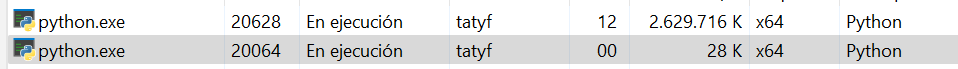

##### b)

En la primera versión, con ciclos, de la pregunta 1:

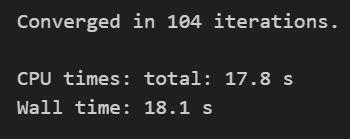

En la segunda versión, con numpy, de la pregunta 3:

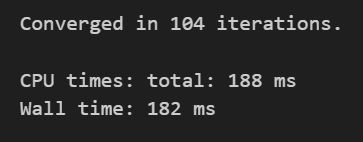

Esta diferencia ocurre porque el primer código se hace mediante ciclos, lo cuál, al ser python, tiene un bloqueo GIL, por lo que se lee línea por línea de código, es más demoroso.

En cambio, el segundo código se hace a través de funciones de librerías que usan código compilado, utilizan otras formas para hacer cálculos de manera más eficiente, en este caso NumPy utiliza LAPACK y BLAS (como se mencionó en clases) que hace que los cálculos se hagan de forma optimizada en C++, por ejemplo.

Es por estas razones la diferencia tan grande en tiempo que se presenta entre segundos y milisegundos, dado que uno procesa cálculos línea por línea y el otro usa rutinas optimizadas de C++ mediante librerías, donde C++ nos da la libertad de un código que no se ejecuta línea por línea.

#### 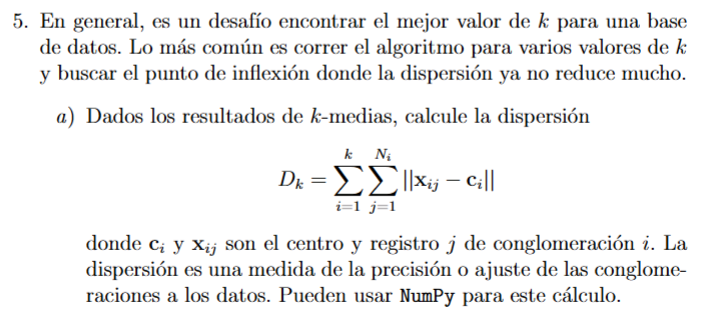

In [25]:
def calc_dispersion_2(datapoints, cluster, centers):
    diferencias = datapoints - centers[cluster]
    return np.sum(np.linalg.norm(diferencias, axis=1))

In [26]:
dispersion_2 = calc_dispersion_2(dataset, history_of_clusters_2[-1], history_of_centers_2[-1])
print("The dispersion of the clustering is", dispersion_2)

The dispersion of the clustering is 8721.596962236534


##### 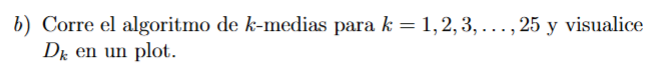

In [27]:
dispersiones = []

for k in range(1,25+1):
    centers_3 = np.zeros((k, 2), dtype=float)
    centers_3[:, 0] = np.arange(1, k+1)/(k+1)

    # store the history of centers and clusters
    history_of_centers_3 = [centers_3]
    history_of_clusters_3 = []

    for iteration in range(max_iterations):

        old_centers_3 = history_of_centers_3[-1]

        # assignment step
        distancias = sp.spatial.distance.cdist(dataset, old_centers_3, metric='euclidean', out=None)
        cluster_3 = np.argmin(distancias, axis=1)

        history_of_clusters_3.append(cluster_3)

        # check convergence
        if iteration > 0:
            clusters_changed_3 = np.any(history_of_clusters_3[-1] != history_of_clusters_3[-2])
            if not clusters_changed_3:
                break

        # update step
        sum_of_locations_3 = np.zeros((k, dataset.shape[1]), dtype='float')
        number_of_points_in_cluster_3 = np.bincount(cluster_3, minlength=k)
        np.add.at(sum_of_locations_3, cluster_3, dataset)

        new_centers_3 = np.array(old_centers_3, copy=True)

        indice = number_of_points_in_cluster_3 > 0
        new_centers_3[indice] = sum_of_locations_3[indice]/number_of_points_in_cluster_3[indice, None]

        history_of_centers_3.append(new_centers_3)

    dispersion_k = calc_dispersion_2(dataset, history_of_clusters_3[-1], history_of_centers_3[-1])
    dispersiones.append(dispersion_k)
    


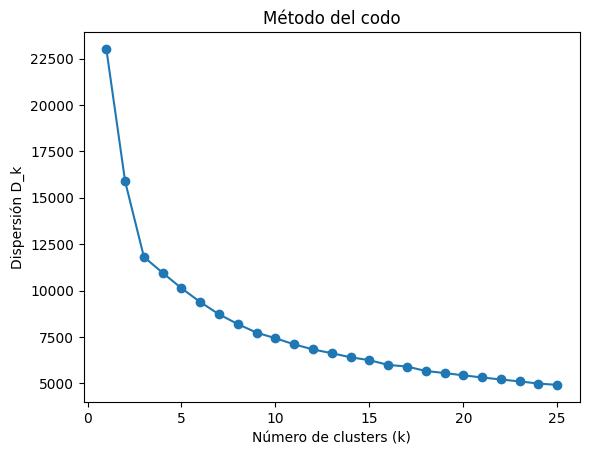

In [28]:
plt.plot(range(1,25+1), dispersiones, marker='o')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Dispersión D_k")
plt.title("Método del codo")
plt.show()

##### 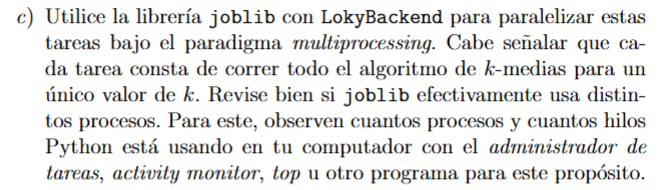

In [29]:
from joblib import Parallel, delayed

def algoritmo_k_medias(k, dataset, max_iterations=10000):
    centers_4 = np.zeros((k, 2), dtype=float)
    centers_4[:, 0] = np.arange(1, k+1)/(k+1)

    # store the history of centers and clusters
    history_of_centers_4 = [centers_4]
    history_of_clusters_4 = []

    for iteration in range(max_iterations):

        old_centers_4 = history_of_centers_4[-1]

        # assignment step
        distancias = sp.spatial.distance.cdist(dataset, old_centers_4, metric='euclidean', out=None)
        cluster_4 = np.argmin(distancias, axis=1)

        history_of_clusters_4.append(cluster_4)

        # check convergence
        if iteration > 0:
            clusters_changed_4 = np.any(history_of_clusters_4[-1] != history_of_clusters_4[-2])
            if not clusters_changed_4:
                break

        # update step
        sum_of_locations_4 = np.zeros((k, dataset.shape[1]), dtype='float')
        number_of_points_in_cluster_4 = np.bincount(cluster_4, minlength=k)
        np.add.at(sum_of_locations_4, cluster_4, dataset)

        new_centers_4 = np.array(old_centers_4, copy=True)

        indice = number_of_points_in_cluster_4 > 0
        new_centers_4[indice] = sum_of_locations_4[indice]/number_of_points_in_cluster_4[indice, None]

        history_of_centers_4.append(new_centers_4)
    
    dispersion_k = calc_dispersion_2(dataset, history_of_clusters_4[-1], history_of_centers_4[-1])
    return k, centers_4, dispersion_k

In [30]:
ks = [delayed(algoritmo_k_medias)(k, dataset) for k in range(1,25+1)]

with Parallel(n_jobs=-1, backend="loky", prefer="processes", verbose=10) as paralelo_k_medias:
    paralelo_resultados = paralelo_k_medias(ks)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  2 out of 25 | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  9 out of 25 | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 13 out of 25 | elapsed:    3.6s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done 16 out of 25 | elapsed:    3.8s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done 19 out of 25 | elapsed:    3.9s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done 22 out of 25 | elapsed:    4.2s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done 25 out of 25 | elapsed:    4.5s finished


In [31]:
paralelo_resultados.sort(key=lambda t: t[0])
k_ordenados = [t[0] for t in paralelo_resultados]
Dk = [t[2] for t in paralelo_resultados]

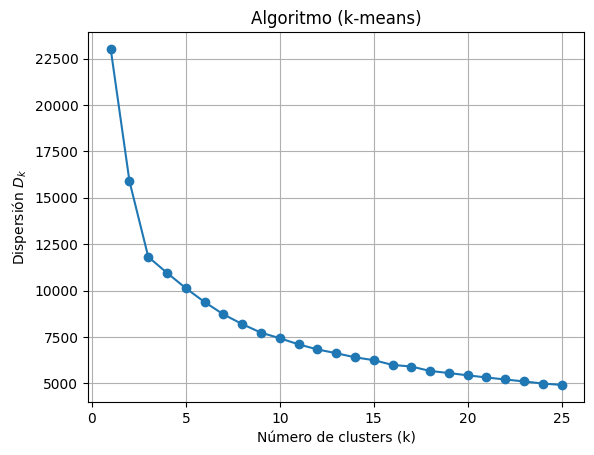

In [32]:
plt.plot(k_ordenados, Dk, marker='o')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Dispersión $D_k$")
plt.title("Algoritmo (k-means)")
plt.grid(True)
plt.show()

Efectivamente se están creando varios procesos e hilos, se pueden visualizar en el administrador de tareas.

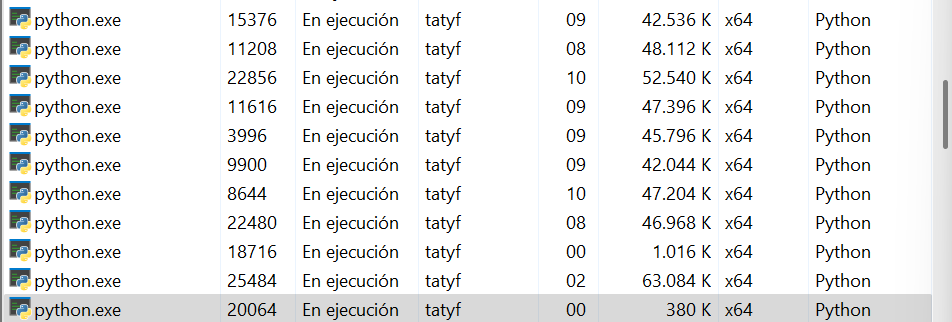

#### 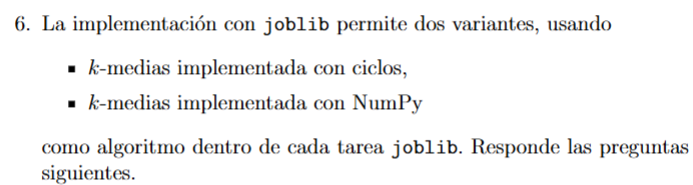

##### 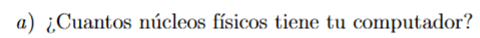

Según la información presente en Rendimiento del Administrador de Tareas, tengo 4 núcleos físicos dentro de la computadora.

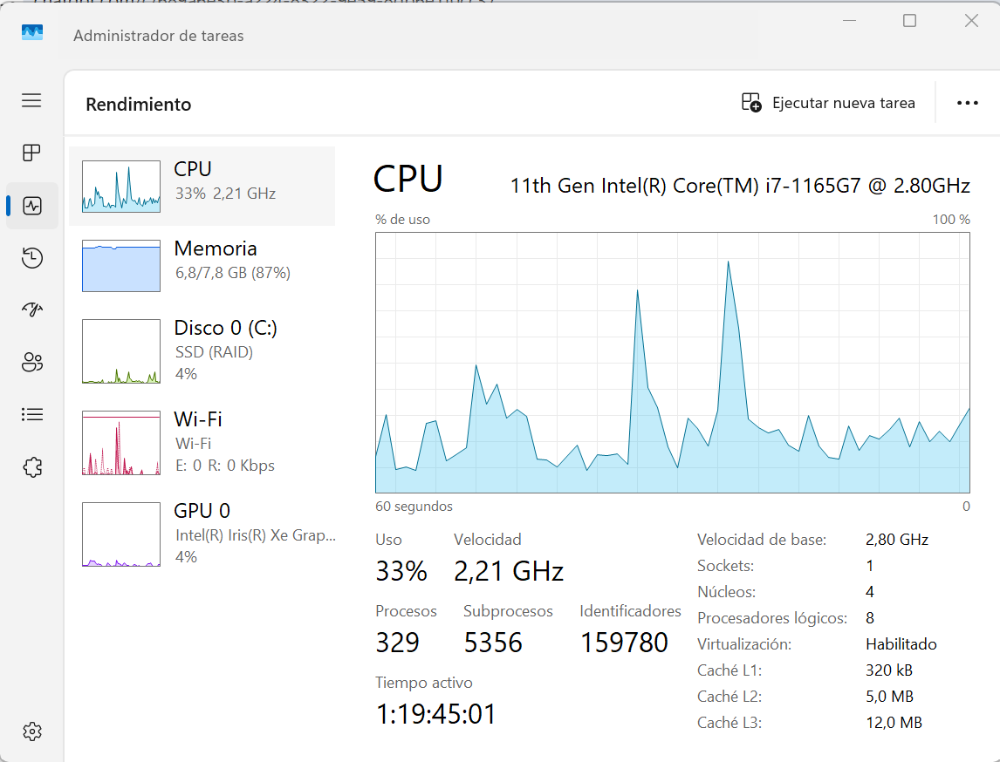

##### 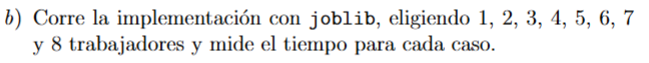

In [33]:
def algoritmo_k_medias_vectorizado(k, dataset, max_iterations=10000):
    centers_4 = np.zeros((k, 2), dtype=float)
    centers_4[:, 0] = np.arange(1, k+1)/(k+1)

    # store the history of centers and clusters
    history_of_centers_4 = [centers_4]
    history_of_clusters_4 = []

    for iteration in range(max_iterations):

        old_centers_4 = history_of_centers_4[-1]

        # assignment step
        distancias = sp.spatial.distance.cdist(dataset, old_centers_4, metric='euclidean', out=None)
        cluster_4 = np.argmin(distancias, axis=1)

        history_of_clusters_4.append(cluster_4)

        # check convergence
        if iteration > 0:
            clusters_changed_4 = np.any(history_of_clusters_4[-1] != history_of_clusters_4[-2])
            if not clusters_changed_4:
                break

        # update step
        sum_of_locations_4 = np.zeros((k, dataset.shape[1]), dtype='float')
        number_of_points_in_cluster_4 = np.bincount(cluster_4, minlength=k)
        np.add.at(sum_of_locations_4, cluster_4, dataset)

        new_centers_4 = np.array(old_centers_4, copy=True)

        indice = number_of_points_in_cluster_4 > 0
        new_centers_4[indice] = sum_of_locations_4[indice]/number_of_points_in_cluster_4[indice, None]

        history_of_centers_4.append(new_centers_4)
    
    dispersion_k = calc_dispersion_2(dataset, history_of_clusters_4[-1], history_of_centers_4[-1])
    return k, centers_4, dispersion_k

In [34]:
def algoritmo_k_medias_ciclos(k, n_points, dataset, max_iterations=1000):
    centers_4 = np.zeros([k, 2])
    for c in range(k):
        centers_4[c,0] = float(c+1)/(k+1)
        centers_4[c,1] = 0.0

    history_of_centers_4 = [centers_4]
    history_of_clusters_4 = []

    for iteration in range(max_iterations):

        old_centers = history_of_centers_4[-1]

        # assignment step
        cluster = np.zeros(n_points, dtype='int')
        for p in range(n_points):
            minimum_distance = np.inf
            nearest_cluster = None
            for c in range(k):
                distance_to_cluster_c = np.sqrt((dataset[p,0] - old_centers[c,0])**2 + (dataset[p,1] - old_centers[c,1])**2)
                if distance_to_cluster_c < minimum_distance:
                    minimum_distance = distance_to_cluster_c
                    nearest_cluster = c
            cluster[p] = nearest_cluster
        history_of_clusters_4.append(cluster)

        # check convergence
        if iteration > 0:
            clusters_changed = False
            for p in range(n_points):
                if history_of_clusters_4[-1][p] != history_of_clusters_4[-2][p]:
                    clusters_changed = True
            if not clusters_changed:
                break

        # update step
        number_of_points_in_cluster = np.zeros(k, dtype='int')
        sum_of_locations = np.zeros([k, 2], dtype='float')
        for p in range(n_points):
            number_of_points_in_cluster[cluster[p]] += 1
            sum_of_locations[cluster[p], :] += dataset[p, :]
        new_centers = np.zeros([k, 2], dtype='float')
        for c in range(k):
            new_centers[c,0] = sum_of_locations[c,0] / number_of_points_in_cluster[c]
            new_centers[c,1] = sum_of_locations[c,1] / number_of_points_in_cluster[c]
        history_of_centers_4.append(new_centers)
    
    dispersion_k = calc_dispersion(dataset, history_of_clusters_4[-1], history_of_centers_4[-1])
    return k, centers_4, dispersion_k

In [35]:
import time

In [36]:
ks = [delayed(algoritmo_k_medias_vectorizado)(k, dataset) for k in range(1,25+1)]
tiempos_vectorizado = []

for n_workers in range(1,9):
    t0 = time.perf_counter()
    with Parallel(n_jobs=n_workers, backend="loky", prefer="processes", verbose=10) as paralelo_k_medias:
        paralelo_resultados = paralelo_k_medias(ks)
    t1 = time.perf_counter()
    tiempos_vectorizado.append(t1 - t0)
    print(f"n_jobs={n_workers}: {t1 - t0:.3f} s")
print(tiempos_vectorizado)

[Parallel(n_jobs=1)]: Done  1 out of 25 | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  4 out of 25 | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  7 out of 25 | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 12 out of 25 | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 17 out of 25 | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done 24 out of 25 | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done 25 out of 25 | elapsed:    3.0s finished


n_jobs=1: 3.098 s


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  1 out of 25 | elapsed:    1.1s
[Parallel(n_jobs=2)]: Done  4 out of 25 | elapsed:    1.3s
[Parallel(n_jobs=2)]: Done  9 out of 25 | elapsed:    2.0s
[Parallel(n_jobs=2)]: Done 14 out of 25 | elapsed:    2.6s
[Parallel(n_jobs=2)]: Done 21 out of 25 | elapsed:    4.1s
[Parallel(n_jobs=2)]: Done 25 out of 25 | elapsed:    4.9s finished
[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.


n_jobs=2: 5.178 s


[Parallel(n_jobs=3)]: Done  2 out of 25 | elapsed:    1.0s
[Parallel(n_jobs=3)]: Done  7 out of 25 | elapsed:    1.6s
[Parallel(n_jobs=3)]: Done 12 out of 25 | elapsed:    2.2s
[Parallel(n_jobs=3)]: Done 19 out of 25 | elapsed:    2.9s
[Parallel(n_jobs=3)]: Done 23 out of 25 | elapsed:    3.5s remaining:    0.2s
[Parallel(n_jobs=3)]: Done 25 out of 25 | elapsed:    4.0s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Batch computation too fast (0.01697850227355957s.) Setting batch_size=2.


n_jobs=3: 4.180 s


[Parallel(n_jobs=4)]: Done  5 out of 25 | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 12 out of 25 | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 18 out of 25 | elapsed:    1.8s remaining:    0.7s
[Parallel(n_jobs=4)]: Done 25 out of 25 | elapsed:    2.8s finished
[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.


n_jobs=4: 2.994 s


[Parallel(n_jobs=5)]: Done  3 out of 25 | elapsed:    1.6s
[Parallel(n_jobs=5)]: Done  8 out of 25 | elapsed:    2.2s
[Parallel(n_jobs=5)]: Done 15 out of 25 | elapsed:    2.7s
[Parallel(n_jobs=5)]: Done 19 out of 25 | elapsed:    3.1s remaining:    0.9s
[Parallel(n_jobs=5)]: Done 22 out of 25 | elapsed:    3.6s remaining:    0.4s
[Parallel(n_jobs=5)]: Done 25 out of 25 | elapsed:    4.0s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  1 out of 25 | elapsed:    0.0s
[Parallel(n_jobs=6)]: Batch computation too fast (0.012811899185180664s.) Setting batch_size=2.


n_jobs=5: 4.218 s


[Parallel(n_jobs=6)]: Done  6 out of 25 | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 11 out of 25 | elapsed:    0.6s remaining:    0.8s
[Parallel(n_jobs=6)]: Done 14 out of 25 | elapsed:    1.4s remaining:    1.1s
[Parallel(n_jobs=6)]: Done 20 out of 25 | elapsed:    1.8s remaining:    0.4s
[Parallel(n_jobs=6)]: Done 23 out of 25 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=6)]: Done 25 out of 25 | elapsed:    2.1s finished
[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Batch computation too fast (0.01671004295349121s.) Setting batch_size=2.


n_jobs=6: 2.217 s


[Parallel(n_jobs=7)]: Done  4 out of 25 | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 11 out of 25 | elapsed:    0.7s
[Parallel(n_jobs=7)]: Done 15 out of 25 | elapsed:    0.9s remaining:    0.6s
[Parallel(n_jobs=7)]: Done 18 out of 25 | elapsed:    1.2s remaining:    0.4s
[Parallel(n_jobs=7)]: Done 21 out of 25 | elapsed:    1.5s remaining:    0.2s
[Parallel(n_jobs=7)]: Done 25 out of 25 | elapsed:    2.1s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Batch computation too fast (0.00815725326538086s.) Setting batch_size=2.
[Parallel(n_jobs=8)]: Done  2 out of 25 | elapsed:    0.0s


n_jobs=7: 2.285 s


[Parallel(n_jobs=8)]: Done  9 out of 25 | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 13 out of 25 | elapsed:    0.7s remaining:    0.6s
[Parallel(n_jobs=8)]: Done 16 out of 25 | elapsed:    0.9s remaining:    0.5s
[Parallel(n_jobs=8)]: Done 19 out of 25 | elapsed:    1.1s remaining:    0.3s
[Parallel(n_jobs=8)]: Done 22 out of 25 | elapsed:    1.4s remaining:    0.1s


n_jobs=8: 2.154 s
[3.0977365999715403, 5.178023100015707, 4.179887400008738, 2.9943691000225954, 4.218277500011027, 2.2174425999983214, 2.284737999958452, 2.153525299974717]


[Parallel(n_jobs=8)]: Done 25 out of 25 | elapsed:    2.0s finished


In [37]:
ks = [delayed(algoritmo_k_medias_ciclos)(k, n_points, dataset) for k in range(1,25+1)]
tiempos_ciclos = []

for n_workers in range(1,9):
    t0 = time.perf_counter()
    with Parallel(n_jobs=n_workers, backend="loky", prefer="processes", verbose=10) as paralelo_k_medias:
        paralelo_resultados = paralelo_k_medias(ks)
    t1 = time.perf_counter()
    tiempos_ciclos.append(t1 - t0)
    print(f"n_jobs={n_workers}: {t1 - t0:.3f} s")
print(tiempos_ciclos)

[Parallel(n_jobs=1)]: Done  1 out of 25 | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  4 out of 25 | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done  7 out of 25 | elapsed:   56.3s
[Parallel(n_jobs=1)]: Done 12 out of 25 | elapsed:  3.8min
[Parallel(n_jobs=1)]: Done 17 out of 25 | elapsed:  7.3min
[Parallel(n_jobs=1)]: Done 24 out of 25 | elapsed: 13.5min
[Parallel(n_jobs=1)]: Done 25 out of 25 | elapsed: 15.1min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.


n_jobs=1: 903.290 s


[Parallel(n_jobs=2)]: Done  1 out of 25 | elapsed:    0.8s
[Parallel(n_jobs=2)]: Done  4 out of 25 | elapsed:    7.5s
[Parallel(n_jobs=2)]: Done  9 out of 25 | elapsed:  1.2min
[Parallel(n_jobs=2)]: Done 14 out of 25 | elapsed:  2.6min
[Parallel(n_jobs=2)]: Done 21 out of 25 | elapsed:  7.1min
[Parallel(n_jobs=2)]: Done 25 out of 25 | elapsed: 10.7min finished
[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.


n_jobs=2: 641.945 s


[Parallel(n_jobs=3)]: Done  2 out of 25 | elapsed:    1.8s
[Parallel(n_jobs=3)]: Done  7 out of 25 | elapsed:  1.0min
[Parallel(n_jobs=3)]: Done 12 out of 25 | elapsed:  2.3min
[Parallel(n_jobs=3)]: Done 19 out of 25 | elapsed:  4.4min
[Parallel(n_jobs=3)]: Done 23 out of 25 | elapsed:  6.2min remaining:   32.2s
[Parallel(n_jobs=3)]: Done 25 out of 25 | elapsed:  7.0min finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


n_jobs=3: 418.752 s


[Parallel(n_jobs=4)]: Batch computation too fast (0.15279579162597656s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done  5 out of 25 | elapsed:   11.6s
[Parallel(n_jobs=4)]: Batch computation too slow (56.514891147613525s.) Setting batch_size=1.
[Parallel(n_jobs=4)]: Done 12 out of 25 | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 18 out of 25 | elapsed:  2.6min remaining:   59.6s
[Parallel(n_jobs=4)]: Done 25 out of 25 | elapsed:  4.1min finished
[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.


n_jobs=4: 248.612 s


[Parallel(n_jobs=5)]: Done  3 out of 25 | elapsed:    2.4s
[Parallel(n_jobs=5)]: Done  8 out of 25 | elapsed:   34.8s
[Parallel(n_jobs=5)]: Done 15 out of 25 | elapsed:  1.4min
[Parallel(n_jobs=5)]: Done 19 out of 25 | elapsed:  2.3min remaining:   43.2s
[Parallel(n_jobs=5)]: Done 22 out of 25 | elapsed:  3.2min remaining:   26.4s
[Parallel(n_jobs=5)]: Done 25 out of 25 | elapsed:  3.9min finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  1 out of 25 | elapsed:    0.0s
[Parallel(n_jobs=6)]: Batch computation too fast (0.13251495361328125s.) Setting batch_size=2.


n_jobs=5: 234.032 s


[Parallel(n_jobs=6)]: Done  6 out of 25 | elapsed:   20.2s
[Parallel(n_jobs=6)]: Done 11 out of 25 | elapsed:   54.2s remaining:  1.2min
[Parallel(n_jobs=6)]: Done 14 out of 25 | elapsed:  1.9min remaining:  1.5min
[Parallel(n_jobs=6)]: Done 20 out of 25 | elapsed:  3.0min remaining:   45.4s
[Parallel(n_jobs=6)]: Done 23 out of 25 | elapsed:  3.5min remaining:   18.3s
[Parallel(n_jobs=6)]: Done 25 out of 25 | elapsed:  3.8min finished
[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.


n_jobs=6: 228.794 s


[Parallel(n_jobs=7)]: Done  4 out of 25 | elapsed:   16.0s
[Parallel(n_jobs=7)]: Done 11 out of 25 | elapsed:  1.0min
[Parallel(n_jobs=7)]: Done 15 out of 25 | elapsed:  1.5min remaining:  1.0min
[Parallel(n_jobs=7)]: Done 18 out of 25 | elapsed:  2.3min remaining:   53.2s
[Parallel(n_jobs=7)]: Done 21 out of 25 | elapsed:  3.0min remaining:   34.4s
[Parallel(n_jobs=7)]: Done 25 out of 25 | elapsed:  3.8min finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Batch computation too fast (0.16517949104309082s.) Setting batch_size=2.


n_jobs=7: 230.627 s


[Parallel(n_jobs=8)]: Done  2 out of 25 | elapsed:    1.8s
[Parallel(n_jobs=8)]: Done  9 out of 25 | elapsed:   53.0s
[Parallel(n_jobs=8)]: Done 13 out of 25 | elapsed:  1.4min remaining:  1.3min
[Parallel(n_jobs=8)]: Done 16 out of 25 | elapsed:  1.9min remaining:  1.1min
[Parallel(n_jobs=8)]: Done 19 out of 25 | elapsed:  2.7min remaining:   51.9s
[Parallel(n_jobs=8)]: Done 22 out of 25 | elapsed:  3.2min remaining:   26.4s


n_jobs=8: 229.723 s
[903.2900838999776, 641.9448789000162, 418.75163529999554, 248.6115218999912, 234.03214560000924, 228.79423940001288, 230.62703699996928, 229.72345549997408]


[Parallel(n_jobs=8)]: Done 25 out of 25 | elapsed:  3.8min finished


In [38]:
for n in range(1,9):
    print(f"{n} : tiempo vectorizado: {tiempos_vectorizado[n-1]} | tiempo ciclos: {tiempos_ciclos[n-1]}")

1 : tiempo vectorizado: 3.0977365999715403 | tiempo ciclos: 903.2900838999776
2 : tiempo vectorizado: 5.178023100015707 | tiempo ciclos: 641.9448789000162
3 : tiempo vectorizado: 4.179887400008738 | tiempo ciclos: 418.75163529999554
4 : tiempo vectorizado: 2.9943691000225954 | tiempo ciclos: 248.6115218999912
5 : tiempo vectorizado: 4.218277500011027 | tiempo ciclos: 234.03214560000924
6 : tiempo vectorizado: 2.2174425999983214 | tiempo ciclos: 228.79423940001288
7 : tiempo vectorizado: 2.284737999958452 | tiempo ciclos: 230.62703699996928
8 : tiempo vectorizado: 2.153525299974717 | tiempo ciclos: 229.72345549997408


##### 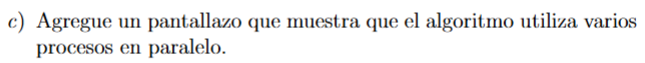

Con este pantallazo demostramos que el algoritmo utiliza varios procesos en paralelo.

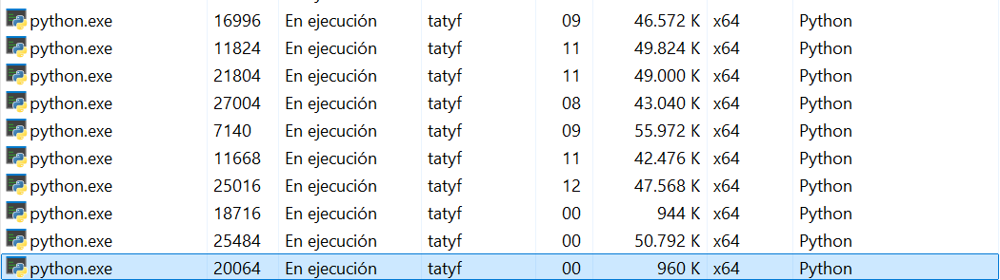

##### 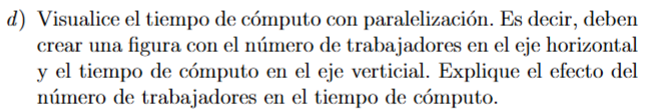

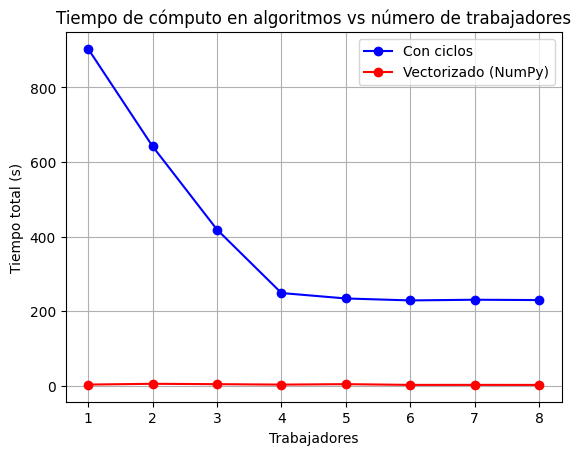

In [39]:
x = list(range(1,9))
plt.plot(x, tiempos_ciclos, marker="o", color="blue", label="Con ciclos")
plt.plot(x, tiempos_vectorizado, marker="o", color="red", label="Vectorizado (NumPy)")

plt.xlabel('Trabajadores')
plt.ylabel('Tiempo total (s)')
plt.title('Tiempo de cómputo en algoritmos vs número de trabajadores')
plt.grid(True); plt.legend(); plt.show()

Le damos un enfoque más cercano al vectorizado para analizarlo mejor.

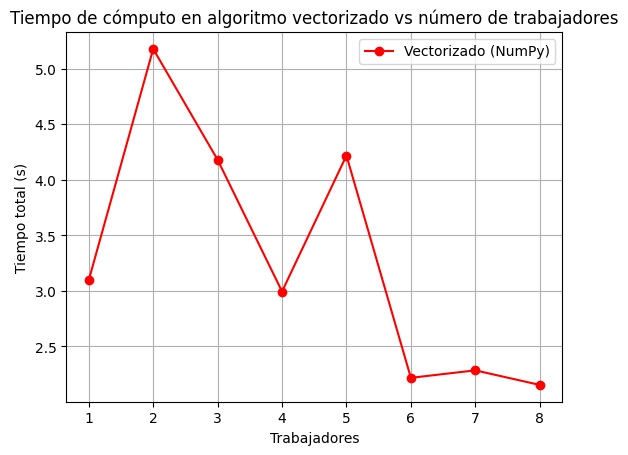

In [40]:
x = list(range(1,9))
plt.plot(x, tiempos_vectorizado, marker="o", color="red", label="Vectorizado (NumPy)")

plt.xlabel('Trabajadores')
plt.ylabel('Tiempo total (s)')
plt.title('Tiempo de cómputo en algoritmo vectorizado vs número de trabajadores')
plt.grid(True); plt.legend(); plt.show()

Como podemos ver, al aumentar el número de trabajadores se disminuye el tiempo que tarda en ejecutarse el código, esto al poder distribuir los procesos en procesos paralelos, permite ejecutar ciertas funciones al mismo tiempo, logrando disminuir el tiempo total de ejecución, es la gracia de ejecutar con procesos paralelos. 

En específico, notamos que en el de ciclos hay una cantidad de trabajadores desde la cuál no hay mucha mejora (específicamente 6 trabajadores), donde aunque se aumente a 7 el tiempo de cómputo no disminuye mucho. Lo mismo ocurre con el algoritmo vectorizado, pero dado que de por si toma menos tiempo, podemos notar mejor que desde 6 trabajadores disminuye menos e incluso desde 7 en adelante el cambio es realmente pequeño. Todo esto porque el código vectorizado de por si trabaja con hilos paralelos gracias a los módulos importados, que se vuelve más eficiente al paralelizar también el algoritmo.

##### 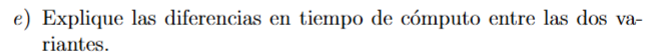

In [41]:
def diff(t0, t1):
    return abs(t1-t0)

diferencias_t = []
for i in range(len(tiempos_ciclos)):
    x = diff(tiempos_ciclos[i], tiempos_vectorizado[i])
    diferencias_t.append(x)
    print(x)

900.1923473000061
636.7668558000005
414.5717478999868
245.6171527999686
229.81386809999822
226.57679680001456
228.34229900001083
227.56993019999936


De los datos anteriores, sabemos que los números más grandes son del algoritmo con ciclos, por lo que la diferencia entre estos es bastante grande debido a que el vectorizado es mucho más eficiente. 

Al utilizar librerías como NumPy, como se explicó anteriormente, permite hacer parte de los procesos como si fuera C++, es decir, paralelizar de forma implícita ciertas cosas, si además incluimos joblib para poder paralelizar de forma explícita, se hacen varios procesos simultaneamente y termina ejecutandose todo mucho más rápido. A diferencia de los ciclos, que al ser python un código con bloqueo, se necesita ir corriendo el código línea por línea y no es posible paralelizar dicho proceso. Esa es la diferencia entre los tiempos de cómputos entre las dos variantes.